# Path integrals for quantum mechanics with MCMC libraries

## Python imports

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline


import numpy as np
from numpy.random import uniform, normal
from scipy import integrate

import matplotlib.pyplot as plt
import seaborn as sns; sns.set_style("darkgrid"); sns.set_context("talk")


from Potential import Potential, V_HO, V_aHO
from Lepage import PathIntegral, bootstrap, binning


## 1-d potentials

### Make some plots of harmonic oscillator

In [2]:
# Instantiate a harmonic oscillator potential 
mass = 1.  
k_osc = 1.  # oscillator constant 
hbar = 1. 

test_ho = V_HO(k_osc, hbar, mass)    # harmonic oscillator
test_aho = V_aHO(k_osc, hbar, mass)  # aharmonic oscillator

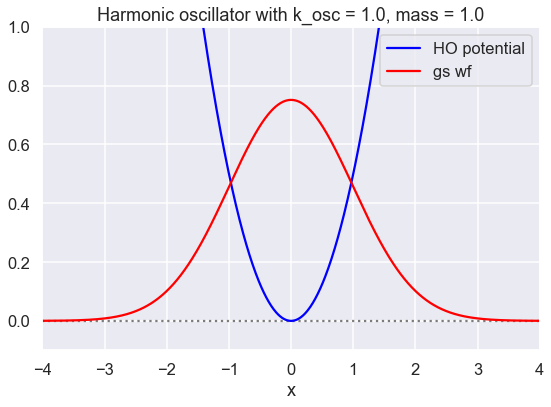

In [3]:
# Check the wave function and potential
x_pts_all = np.arange(-4., 4., .01)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel(r'x')
#ax.set_ylabel(r'g(x)')
ax.set_xlim(-4., 4.)
ax.set_ylim(-0.1, 1.)
ax.axhline(0., color='black', alpha=0.5, linestyle='dotted')

test_ho.plot_V(ax, x_pts_all, V_label='HO potential')
ax.plot(x_pts_all, test_ho.wf_gs(x_pts_all), color='red', alpha=1, label='gs wf')

ax.set_title(f'{test_ho.V_string} with k_osc = {k_osc:.1f}, mass = {mass:.1f}')
ax.legend()
fig.tight_layout()

In [4]:
# Normalization check of wave function squared
integrate.simps(test_ho.wf_gs(x_pts_all)**2, x_pts_all)

0.9999999839221155

## Metropolis calculation (section 2.2 of Lepage lectures)

Now instead of an integration over all paths, we want to select a representative sampling of the "paths" that are distributed according to $e^{-S[x]}$.  If we succeed, we can take an unweighted average over these paths to approximate the weighted average over uniformly distributed paths.

We will use the Metropolis algorithm to generate a sequence of paths.

Define a function to initialize the first path, which is set to zero at each of the Npts times:

We update the path following the Metropolis algorithm:
1.  Step through each time point from j = 0 to Npts-1
2.  Save the value of the path at current time point j
3.  Calculate the current value of the action (only considering contributions that depend on j with speed)
4.  Generate a random number xi from -epsilon to epsilon and consider x_j --> x_j + xi
5.  Find Delta S (change in the action) for this change:  
    a. If Delta S < 0 (action reduced), keep new x_j and go to next value of j.  
    b. If Delta S > 0 (action increased), generate eta between 0 and 1. Keep new x_j if exp(-Delta S) > eta, otherwise keep old value and move on to the next j.
6.  In general we keep track of the "success" rate and adjust epsilon so that it is about 50% successes.

Define a function to do this update and print the new path at the end.

Define a function to calculate the contribution to the Hamiltonian (the energy) from time point j:

To do:
* Check for equilibration
* Check for autocorrelation
* Histogram the energy calculations and compare to the expected error

## Class for path integral

In [5]:
# Modules needed for example: emcee is for MCMCsampling, corner for plotting
from scipy import stats
import emcee
import corner

### Discretize time 

In [6]:
Delta_T = 0.25           # DeltaT --> "a" in Lepage
N_pts = 20              # N_pts --> "N" in Lepage 
Tmax = Delta_T * N_pts   # Tmax --> "T" in Lepage

### Set the number of configurations to generate (Nconfig) and the correlation time (Ncorr)

In [7]:
N_config = 100   # We'll want to try 25, 100, 1000, 10000 
N_corr = 20      # Lepage recommends 20 or so 
eps = 1.4        # suggested epsilon

### Set up the Metropolis procedure for the energy

Here is the basic plan:  
1. Initialize the first path to all zeros for x_j.
2. Do (5-10)*Ncorr updates to thermalize the path.  
3. Update Ncorr times, keep that path (or do the calculation of the energy with that path).
4. Repeat the last step Nconfig times.
5. Average the Nconfig values of the energy to get the estimate. 

Ok, let's set it up!  

In [8]:
# Instantiate a harmonic oscillator potential
mass = 1.  
k_osc = 1.  # oscillator constant 
hbar = 1. 

test_ho = V_HO(k_osc, hbar, mass)
test_aho = V_aHO(k_osc, hbar, mass)

In [9]:
testPI = PathIntegral(V_pot=test_ho)

In [10]:
x_path = testPI.initialize(eps=.1)
testPI.display_x_path(x_path)

[-0.17826508  0.0192446   0.06089165 -0.00111553 -0.03090047  0.0318631
  0.11237734 -0.00446076  0.03626776 -0.1232189  -0.06187099 -0.05295375
  0.18363028 -0.02503797 -0.01463466 -0.21276804  0.1804236  -0.10948478
  0.09849947 -0.00396124]


In [11]:
testPI.update(x_path)
testPI.display_x_path(x_path)

[-0.11069629  0.0192446   0.31992098 -0.00111553 -0.15912881  0.0318631
  0.40915769 -0.00446076  0.03626776 -0.1232189  -0.06187099 -0.05295375
 -0.22951558 -0.21468307 -0.01463466 -0.21276804  0.1804236  -0.10948478
  0.09849947 -0.00396124]


In [12]:
Delta_T = 0.25           # Delta_T --> "a" in Lepage
N_pts = 20               # N_pts --> "N" in Lepage 
Tmax = Delta_T * N_pts   # Tmax --> "T" in Lepage

N_config = 4000  # We'll want to try 25, 100, 1000, 10000 
N_corr = 20      # Lepage recommends 20 or so 
eps = 1.4        # suggested epsilon

new_PI = PathIntegral(Delta_T=Delta_T, N_pts=N_pts, N_config=N_config, 
                      N_corr=N_corr, eps=eps, V_pot=test_ho)

list_of_paths = new_PI.MC_paths()

#print(f'Energy = {E_mean:.5f} +/- {E_sem:.5f}')

In [13]:
print(list_of_paths.shape)
E_avg = new_PI.E_avg_over_paths(list_of_paths)
print(f'Average over {N_config} configurations is {E_avg:.5f}')


(4000, 20)
Average over 4000 configurations is 0.49919


At this point we could increase Nconfig to get a better answer or run it many times and average:

In [14]:
new_PI = PathIntegral(Delta_T=Delta_T, N_pts=N_pts, N_config=N_config, 
                      N_corr=N_corr, eps=eps, V_pot=test_ho)

list_of_paths = new_PI.MC_paths()


In [15]:
def energy_avg(N_trials, N_config_each):
    """
    Return the mean and standard deviation of N_trials of the energy
    """
    my_PI = PathIntegral(Delta_T=Delta_T, N_pts=N_pts, N_config=N_config_each, 
                      N_corr=N_corr, eps=eps, V_pot=test_ho)
    E_list = np.zeros(N_trials)
    for i in range(N_trials):
        short_list = my_PI.MC_paths()
        E_list[i] = my_PI.E_avg_over_paths(short_list)
    #print(E_list)
    E_mean = np.mean(E_list)
    E_std = np.std(E_list)
    return E_mean, E_std, E_std / np.sqrt(N_trials)

In [16]:
E_mean, E_std, E_sem = energy_avg(20, 100)
print(f'Energy = {E_mean:.5f} +/- {E_sem:.5f}')


Energy = 0.49968 +/- 0.00411


In [17]:
energy_means = []
energy_stds = []
energy_sems = []

N_trials = 100
for i in range(N_trials):
    # energy_avg()
    E_mean, E_std, E_sem = energy_avg(10, 100) # average over 10 
    #print(E_mean)
    energy_means = np.append(energy_means, E_mean)
    energy_stds = np.append(energy_stds, E_std)    
    energy_sems = np.append(energy_sems, E_sem)    

The mean of the energy means is 0.50054


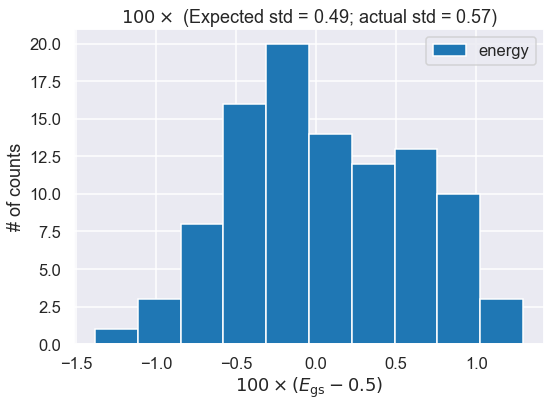

In [18]:
# Make a histogram plot of the energy and compare to expected width
expect_std = 100 * np.mean(energy_sems)
actual_std = 100 * np.std(energy_means)

mean_of_means = np.mean(energy_means)
print(f'The mean of the energy means is {mean_of_means:.5f}')

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel(r'$100 \times (E_{\rm gs} - 0.5) $')
ax.set_ylabel(r'# of counts')
ax.set_title(fr'$100 \times$ (Expected std = {expect_std:.2f}; actual std = {actual_std:.2f})')

ax.hist(100*(energy_means - 0.5), bins=10, density=False, label='energy')

# ax.axhline(0., color='black', alpha=0.5, linestyle='dotted')
# ax.plot(x_pts_all, V_HO(x_pts_all), color='blue', alpha=1, label='HO potential')
# ax.plot(x_pts_all, HO_gs_wf(x_pts_all), color='red', alpha=1, label='gs wf')
# ax.set_title(f'Harmonic oscillator with k_osc = {k_osc:.1f}, mass = {mass:.1f}')

ax.legend()
fig.tight_layout()

### Test of emcee

We'll take $\theta$ to be the values of $x$ at each of the `N_pts` time points. We'll choose the prior to be uniform in a reasonable range of $x$. Lepage suggests $-5 \leq x \leq +5$ is large enough to have negligible effect. Here `X` will be data.

In [19]:
x_min = -5.
x_max = +5.
min_theta = x_min * np.ones(N_pts)
max_theta = x_max * np.ones(N_pts)
volume_theta=np.prod(max_theta-min_theta)

def log_prior(theta):
    '''Log prior for parameter array theta'''
    assert len(theta)==N_pts, "Parameter vector must have length N_pts."
    # flat prior 
    if np.logical_and(min_theta<=theta, theta<=max_theta).all(): 
        return np.log(1/volume_theta)
    else:
        return -np.inf

def log_likelihood(theta, path_integral):
    '''Log likelihood for path integral given parameter array theta
        is given by minus the action for that path.
    '''
    try:
        return -path_integral.S_lattice(theta)
    except ValueError:
        return -np.inf

def log_posterior(theta, path_integral):
    '''Log posterior for path integral given parameter array theta'''
    return log_prior(theta) + log_likelihood(theta, path_integral)

In [20]:
path_integral = new_PI
N_corr = 20      # Lepage recommends 20 or so 

ndim = N_pts  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nburn = 50 * N_corr  # "burn-in" period to let chains stabilize
nsteps = 20000  # number of MCMC steps to take

# we'll start at random locations within the prior volume
# we'll change this to normal distribution
# starting_guesses = min_theta + \
#                    (max_theta - min_theta) * np.random.rand(nwalkers,ndim)
starting_guesses = (x_max/10) * np.random.randn(nwalkers,ndim)

print(f"MCMC sampling using emcee (affine-invariant ensamble sampler) with {nwalkers} walkers")
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_posterior, args=[path_integral])

# "burn-in" period; save final positions and then reset
pos, prob, state = sampler.run_mcmc(starting_guesses, nburn)
sampler.reset()

# sampling period
sampler.run_mcmc(pos, nsteps)

print("Mean acceptance fraction: {0:.3f} (in total {1} steps)"
                .format(np.mean(sampler.acceptance_fraction),nwalkers*nsteps))

# discard burn-in points and flatten the walkers; the shape of samples is (nwalkers*nsteps, ndim)
samples = sampler.chain.reshape((-1, ndim))

MCMC sampling using emcee (affine-invariant ensamble sampler) with 50 walkers
Mean acceptance fraction: 0.299 (in total 1000000 steps)


In [21]:
# tau = sampler.get_autocorr_time()
# print(tau)

In [22]:

print(samples.shape)
E_avg = new_PI.E_avg_over_paths(samples)
print(f'Average over {int(nwalkers*nsteps)} configurations is {E_avg:.5f}')


(1000000, 20)
Average over 1000000 configurations is 0.49964


In [23]:
samples_thinned = sampler.get_chain(discard=0, flat=True, thin=N_corr)

print(samples_thinned.shape)
E_avg = new_PI.E_avg_over_paths(samples_thinned)
print(f'Average over {int(nwalkers*nsteps/N_corr)} configurations is {E_avg:.5f}')


(50000, 20)
Average over 50000 configurations is 0.49938


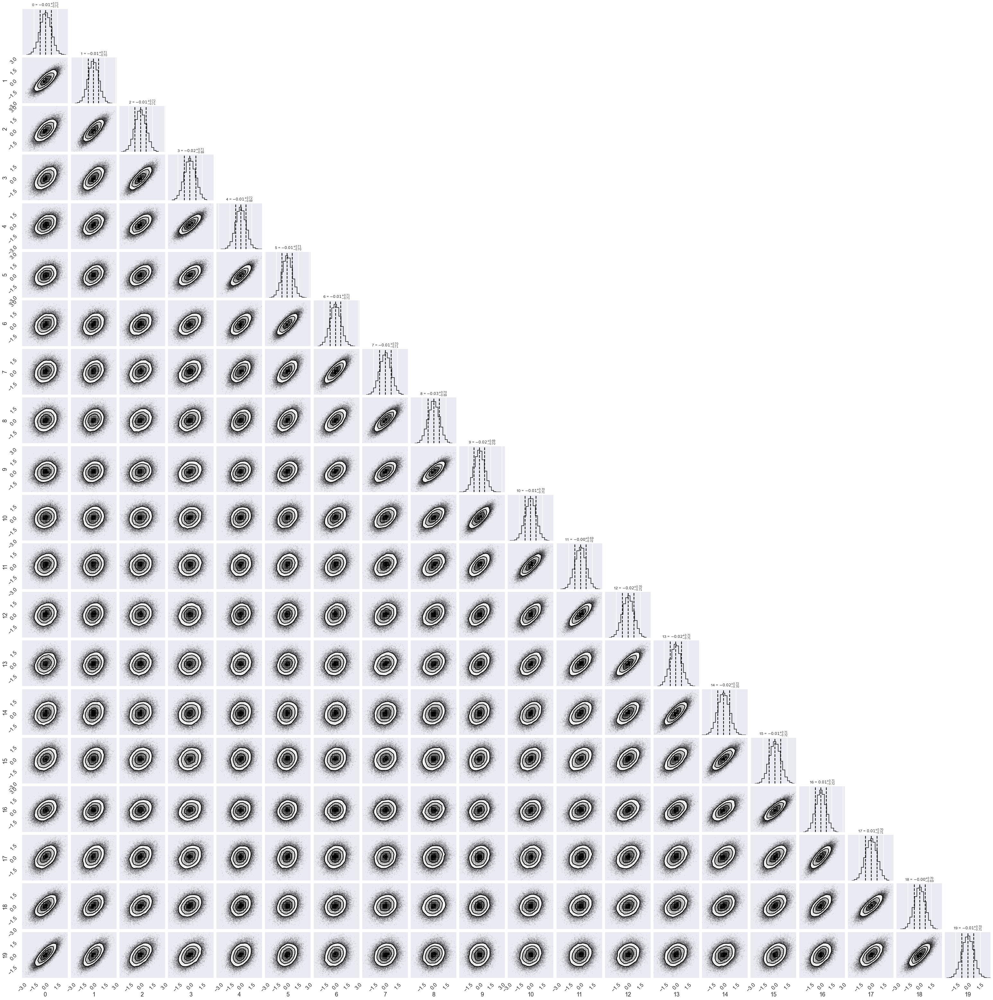

In [24]:
# make a corner plot with the posterior distribution
labels = [f"{str:.0f}" for str in range(N_pts)]

fig = corner.corner(samples_thinned, labels=labels,
                    quantiles=[0.16, 0.5, 0.84],
                    show_titles=True, title_kwargs={"fontsize": 12})


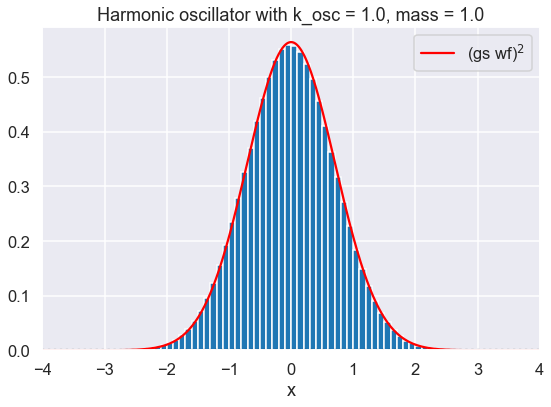

In [25]:
# Check the wave function and potential
x_pts_all = np.arange(-4., 4., .01)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel(r'x')
#ax.set_ylabel(r'g(x)')
ax.set_xlim(-4., 4.)
#ax.set_ylim(-0.1, 1.)
ax.axhline(0., color='black', alpha=0.5, linestyle='dotted')

#test_ho.plot_V(ax, x_pts_all, V_label='HO potential')
ax.plot(x_pts_all, test_ho.wf_gs(x_pts_all)**2, color='red', alpha=1, label=fr'(gs wf)${{}}^2$')
#ax.hist(samples[:,3], bins=np.arange(x_min, x_max, .1), density=True)
ax.hist(samples.flatten(), bins=np.arange(x_min, x_max, .1), density=True)
#ax.hist(samples[:,1], bins=100, density=True)

ax.set_title(f'{test_ho.V_string} with k_osc = {k_osc:.1f}, mass = {mass:.1f}')
ax.legend()
fig.tight_layout()

### Try with zeus

In [26]:
import zeus

In [27]:
path_integral = new_PI
N_corr = 20      # Lepage recommends 20 or so 

ndim = N_pts  # number of parameters in the model
nwalkers = 50  # number of MCMC walkers
nburn = 10 * N_corr  # "burn-in" period to let chains stabilize
nsteps = 1000  # number of MCMC steps to take

# we'll start at random locations within the prior volume
# we'll change this to normal distribution
# starting_guesses = min_theta + \
#                    (max_theta - min_theta) * np.random.rand(nwalkers,ndim)
starting_guesses = (x_max/10) * np.random.randn(nwalkers,ndim)
#starting_guesses = (x_max/100) * np.random.randn(nwalkers,ndim)

# Do the burn-in with nburn steps
print(f"MCMC sampling using zeus (ensamble slice sampler) with {nwalkers} walkers")
sampler = zeus.EnsembleSampler(nwalkers, ndim, log_posterior, args=[path_integral])
sampler.run_mcmc(starting_guesses, nburn)

# Get the burn-in samples
burnin = sampler.get_chain()

# reset the start
starting_guesses = burnin[-1]

# now do the post-burn-in sampling with nsteps steps
sampler = zeus.EnsembleSampler(nwalkers, ndim, log_posterior, args=[path_integral])
sampler.run_mcmc(starting_guesses, nsteps)

Initialising ensemble of 50 walkers...


MCMC sampling using zeus (ensamble slice sampler) with 50 walkers


Sampling progress : 100%|████████████████████| 200/200 [00:01<00:00, 102.29it/s]
Initialising ensemble of 50 walkers...
Sampling progress : 100%|██████████████████| 1000/1000 [00:09<00:00, 104.90it/s]


In [28]:
chain_thinned = sampler.get_chain(discard=0, flat=True, thin=N_corr)

print(chain_thinned.shape)
E_avg = new_PI.E_avg_over_paths(chain_thinned)
print(f'Average over {int(nwalkers*nsteps/N_corr)} configurations is {E_avg:.5f}')


(2500, 20)
Average over 2500 configurations is 0.50135


In [29]:
chain = sampler.get_chain(flat=True, discard=0, thin=1)
chain.shape

E_avg = new_PI.E_avg_over_paths(chain)
print(f'Average over {int(nwalkers*nsteps)} configurations is {E_avg:.5f}')


Average over 50000 configurations is 0.50074


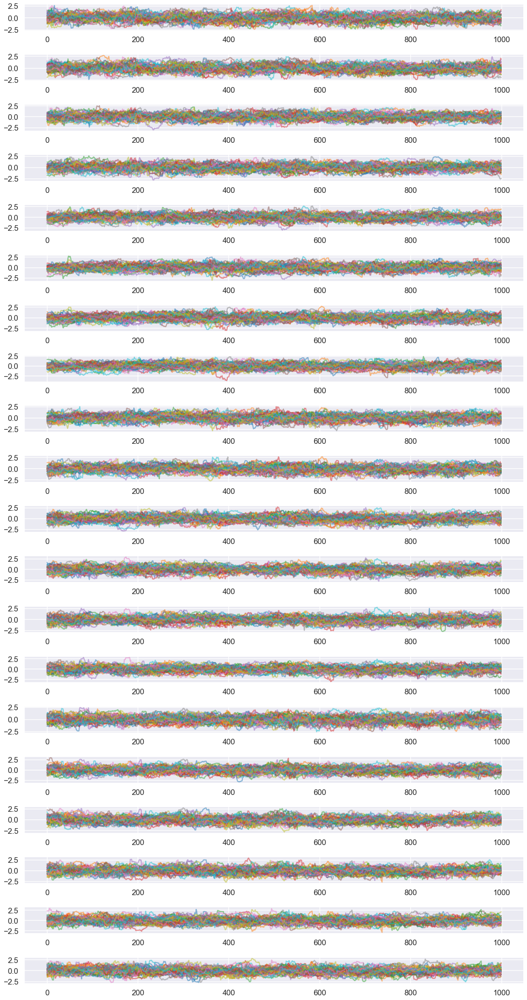

In [30]:
plt.figure(figsize=(16,1.5*ndim))
for n in range(ndim):
    plt.subplot2grid((ndim, 1), (n, 0))
    plt.plot(sampler.get_chain()[:,:,n],alpha=0.5)
    #plt.plot(chain[:,n],alpha=0.5)
    #plt.axhline(y=mu[n])
plt.tight_layout()
plt.show()

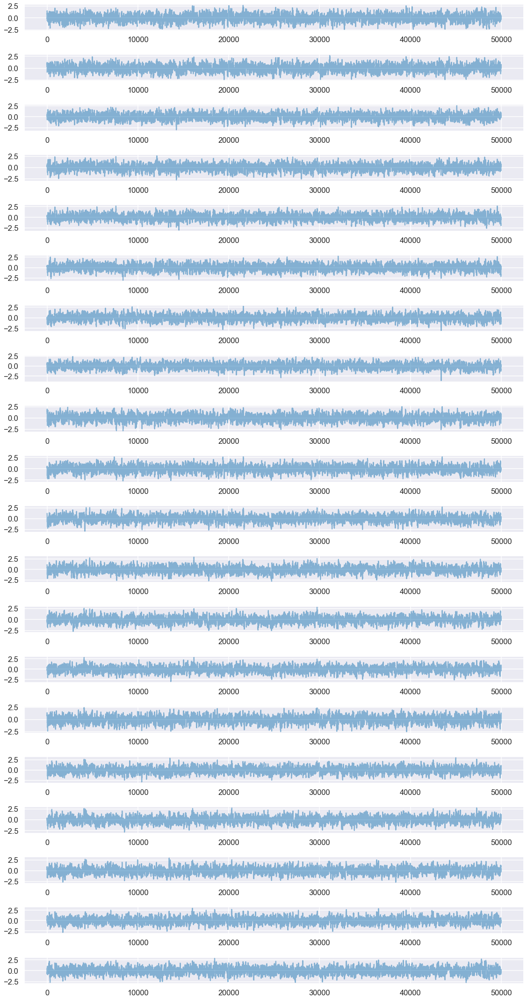

In [31]:
plt.figure(figsize=(16,1.5*ndim))
for n in range(ndim):
    plt.subplot2grid((ndim, 1), (n, 0))
    #plt.plot(sampler.get_chain()[:,:,n],alpha=0.5)
    plt.plot(chain[:,n],alpha=0.5)
    #plt.axhline(y=mu[n])
plt.tight_layout()
plt.show()

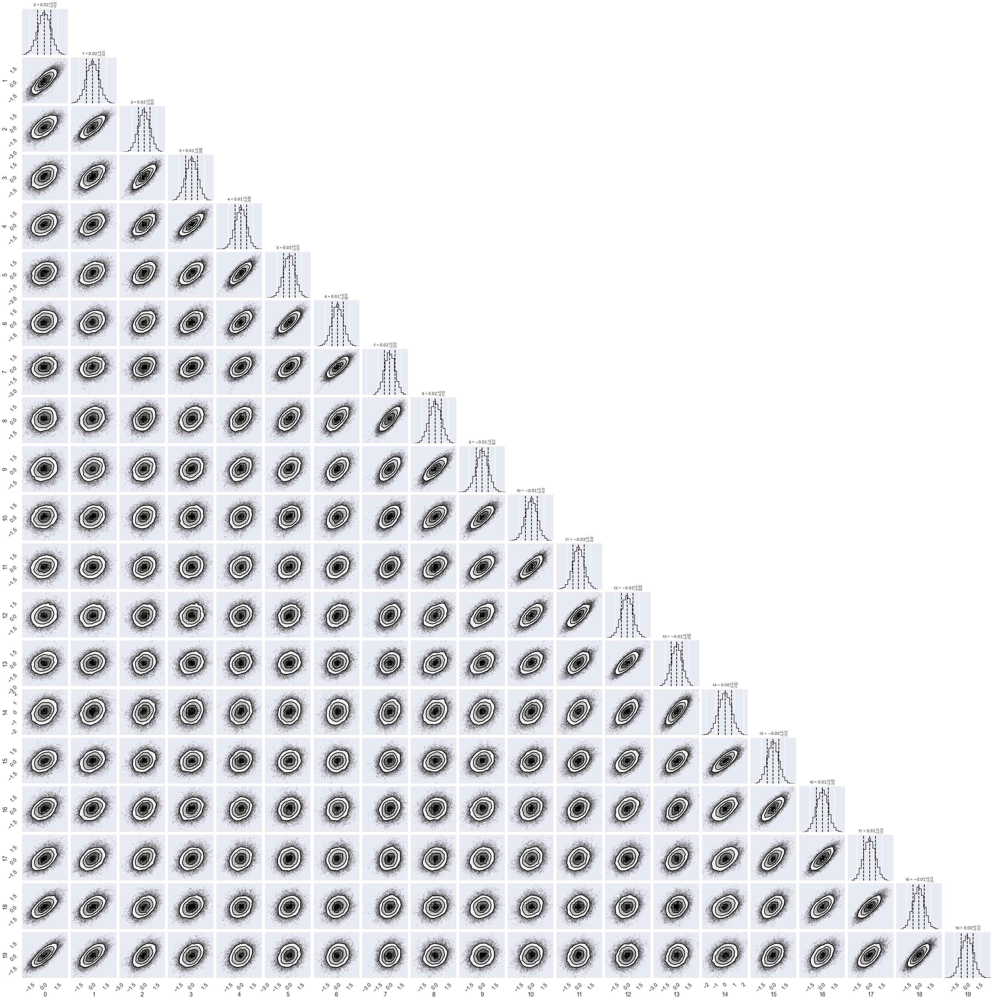

In [32]:
# make a corner plot with the posterior distribution
fig = corner.corner(chain, labels=labels,
                    quantiles=[0.16, 0.5, 0.84],
                    show_titles=True, title_kwargs={"fontsize": 12})



In [33]:
# # Try the zeus corner plot routine, using every 10
# fig, axes = zeus.cornerplot(chain[::10], size=(8,8))

### Trying a larger lattice spacing a

In [34]:
Delta_T = 0.50           # Delta_T --> "a" in Lepage
N_pts = 20               # N_pts --> "N" in Lepage 
Tmax = Delta_T * N_pts   # Tmax --> "T" in Lepage

N_config = 4000  # We'll want to try 25, 100, 1000, 10000 
N_corr = 20      # Lepage recommends 20 or so 
eps = 1.4        # suggested epsilon

new_PI = PathIntegral(Delta_T=Delta_T, N_pts=N_pts, N_config=N_config, 
                      N_corr=N_corr, eps=eps, V_pot=test_ho)


In [35]:
list_of_paths = new_PI.MC_paths()

print(list_of_paths.shape)
E_avg = new_PI.E_avg_over_paths(list_of_paths)
print(f'Average over {N_config} configurations is {E_avg:.5f}')


(4000, 20)
Average over 4000 configurations is 0.49988


In [36]:
E_avg_test = np.array([new_PI.Gamma_avg_over_paths(new_PI.H_lattice_j, n, list_of_paths) for n in range(N_pts)])
    
print(f'Average over {N_config} configurations at each n: ', E_avg_test)

print(f'\nMean: {np.mean(E_avg_test):.5f} +/- {np.std(E_avg_test)/np.sqrt(N_pts):.5f}')

Average over 4000 configurations at each n:  [0.50536495 0.50560835 0.48944631 0.50431955 0.50410722 0.49256258
 0.50217984 0.49675278 0.51357079 0.48634919 0.50117443 0.48684838
 0.4930489  0.48926241 0.49615487 0.48830834 0.51098903 0.50612392
 0.51746337 0.50800539]

Mean: 0.49988 +/- 0.00204


In [37]:
g_avg_test = np.array([new_PI.Gamma_avg_over_paths(new_PI.compute_G, n, list_of_paths) for n in range(N_pts)])

print(g_avg_test)

[0.48437591 0.29498188 0.1784622  0.10814157 0.06687427 0.04331064
 0.0290784  0.01750599 0.01006227 0.00772905 0.00748672 0.00772905
 0.01006227 0.01750599 0.0290784  0.04331064 0.06687427 0.10814157
 0.1784622  0.29498188]


In [38]:
DeltaE = np.array([np.log(g_avg_test[n] / g_avg_test[n+1]) / Delta_T for n in range(N_pts-1)])
print(DeltaE)

[ 0.99189468  1.00507423  1.00187131  0.96125387  0.86883188  0.79680548
  1.01490443  1.10750051  0.52761485  0.06370989 -0.06370989 -0.52761485
 -1.10750051 -1.01490443 -0.79680548 -0.86883188 -0.96125387 -1.00187131
 -1.00507423]


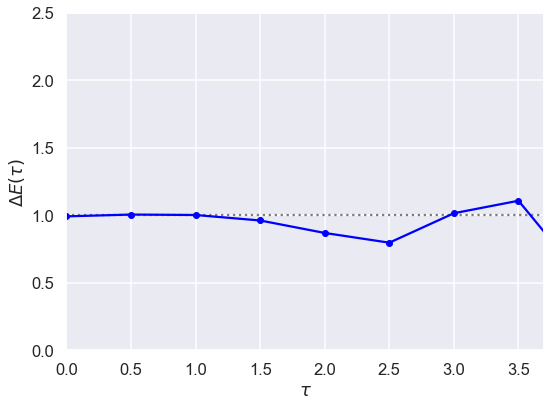

In [39]:
# Check the wave function and potential
t_pts_all = np.arange(0, (N_pts-1)*Delta_T, Delta_T)

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel(r'$\tau$')
ax.set_ylabel(r'$\Delta E(\tau)$')
ax.set_xlim(0,3.7)
ax.set_ylim(0, 2.5)
ax.axhline(1., color='black', alpha=0.5, linestyle='dotted')

ax.plot(t_pts_all, DeltaE, color='blue', alpha=1, marker='o', markersize=6)
#ax.legend()
fig.tight_layout()